In [1]:
# %pip install opencv-python numpy matplotlib

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt


def display_images(images, titles, figsize=(15, 5)):
    """Helper function to display multiple images side by side"""
    fig, axes = plt.subplots(1, len(images), figsize=figsize)

    for i, (img, title) in enumerate(zip(images, titles)):
        if len(images) == 1:
            ax = axes
        else:
            ax = axes[i]
        ax.imshow(img, cmap="gray" if len(img.shape) == 2 else None)
        ax.set_title(title)
        ax.axis("off")
    plt.tight_layout()
    plt.show()


#  the higher the h value, the more denoising is applied
def denoise_image(image, h=3):
    """Apply denoising using Non-local Means Denoising"""
    return (
        cv2.fastNlMeansDenoising(image, h=h)
        if len(image.shape) == 2
        else cv2.fastNlMeansDenoisingColored(image, h=h)
    )


def apply_morphology(image, operation="erosion", kernel_size=5):
    """Apply morphological operations (erosion or dilation)"""
    kernel = np.ones((kernel_size, kernel_size), np.uint8)
    if operation == "erosion":
        return cv2.erode(image, kernel, iterations=1)
    else:  # dilation
        return cv2.dilate(image, kernel, iterations=1)


def apply_threshold(image, method="binary"):
    """Apply different thresholding methods"""
    if len(image.shape) > 2:
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    if method == "binary":
        _, thresh = cv2.threshold(image, 127, 255, cv2.THRESH_BINARY)
    elif method == "adaptive":
        thresh = cv2.adaptiveThreshold(
            image, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2
        )
    elif method == "otsu":
        _, thresh = cv2.threshold(image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    return thresh


def detect_edges(image, method="canny"):
    """Apply edge detection"""
    if len(image.shape) > 2:
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    if method == "canny":
        return cv2.Canny(image, 100, 200)
    elif method == "sobel":
        sobelx = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=5)
        sobely = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=5)
        return cv2.magnitude(sobelx, sobely)


def equalize_histogram(image):
    """Apply histogram equalization"""
    if len(image.shape) == 2:
        return cv2.equalizeHist(image)
    else:
        # Convert to LAB color space
        lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
        l, a, b = cv2.split(lab)
        # Apply histogram equalization to L channel
        l_eq = cv2.equalizeHist(l)
        # Merge channels and convert back to BGR
        lab_eq = cv2.merge([l_eq, a, b])
        return cv2.cvtColor(lab_eq, cv2.COLOR_LAB2BGR)


# Example usage:
image_path = "low quality documents/1.png"
img = cv2.imread(image_path)
if img is None:
    raise ValueError(f"Could not read image at {image_path}")

# Convert BGR to RGB for display
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Apply different techniques
denoised = cv2.cvtColor(denoise_image(img), cv2.COLOR_BGR2RGB)
eroded = cv2.cvtColor(apply_morphology(img, "erosion"), cv2.COLOR_BGR2RGB)
dilated = cv2.cvtColor(apply_morphology(img, "dilation"), cv2.COLOR_BGR2RGB)
threshold = apply_threshold(img, "otsu")
edges = detect_edges(img)
equalized = cv2.cvtColor(equalize_histogram(img), cv2.COLOR_BGR2RGB)

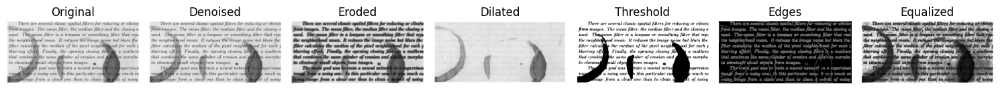

In [3]:
techniques = [img_rgb, denoised, eroded, dilated, threshold, edges, equalized]
titles = [
    "Original",
    "Denoised",
    "Eroded",
    "Dilated",
    "Threshold",
    "Edges",
    "Equalized",
]
display_images(techniques, titles)

### First img

#### First try:

In [ ]:
def repeat_action(image, action, times=3, kernel_size=2):
    for i in range(times):
        image = apply_morphology(image, action, kernel_size)
    return image

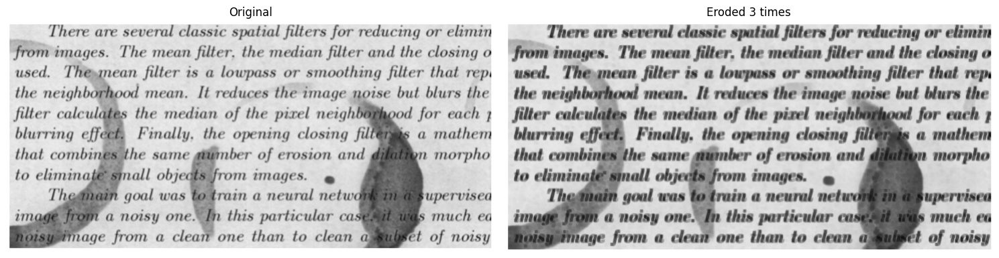

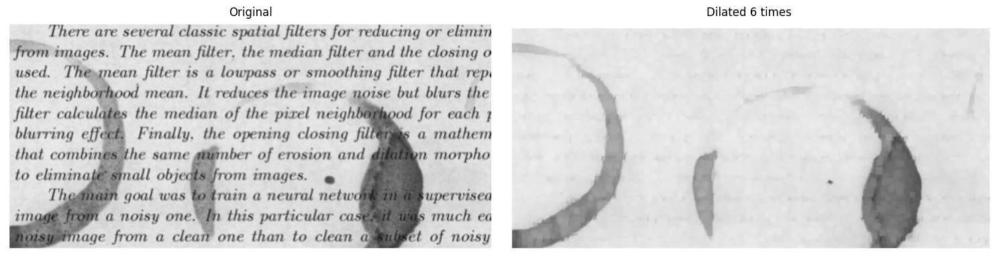

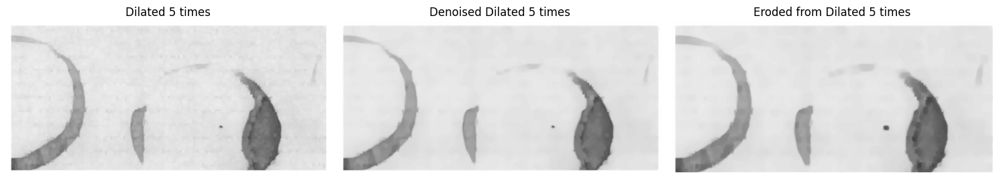

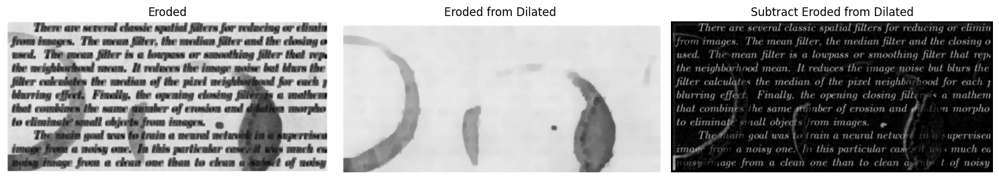

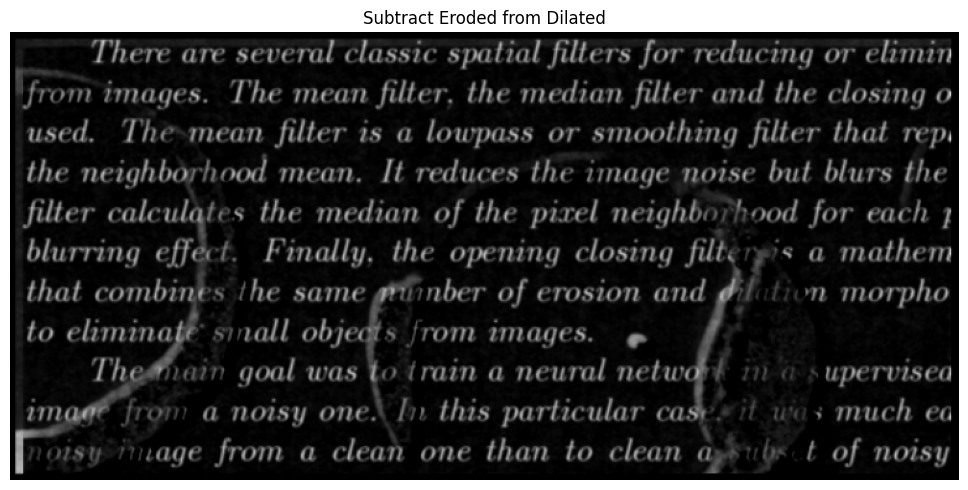

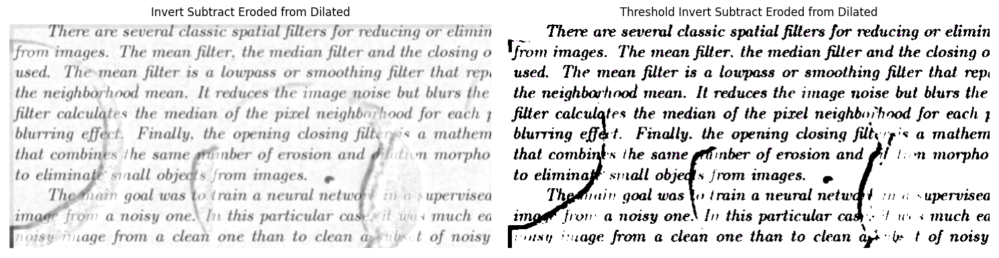

In [ ]:
# Repeat erosion 2 times
eroded_times = repeat_action(img, "erosion", times=2, kernel_size=2)
display_images([img_rgb, eroded_times], ["Original", "Eroded 2 times"])

# Repeat dilation 6 times
dilate_nr = 6
dilated_times = repeat_action(img, "dilation", times=dilate_nr, kernel_size=2)
display_images([img_rgb, dilated_times], ["Original", f"Dilated {dilate_nr} times"])

# Denoise the dilated image
denoised_dilated_times = cv2.cvtColor(denoise_image(dilated_times), cv2.COLOR_BGR2RGB)

# Repeat erosion 5 times on the denoised dilated image
eroded_from_dilated = repeat_action(
    denoised_dilated_times, "erosion", times=5, kernel_size=2
)
display_images(
    [dilated_times, denoised_dilated_times, eroded_from_dilated],
    [f"Dilated {dilate_nr} times", "Denoised Dilated", "Eroded from Dilated"],
)

# Subtract the eroded image from the original
subtract_eroded_dilated = cv2.subtract(eroded_from_dilated, img_rgb)
display_images(
    [eroded, eroded_from_dilated, subtract_eroded_dilated],
    ["Eroded", "Eroded from Dilated", "Subtract Eroded from Dilated"],
)
display_images([subtract_eroded_dilated], ["Subtract Eroded from Dilated"])

# Invert the subtraction result
invert_subtract_eroded_dilated = cv2.bitwise_not(subtract_eroded_dilated)

# Apply threshold to the inverted image
_, threshold_subtract_eroded_dilated = cv2.threshold(
    invert_subtract_eroded_dilated, 200, 255, cv2.THRESH_BINARY
)
display_images(
    [invert_subtract_eroded_dilated, threshold_subtract_eroded_dilated],
    [
        "Invert Subtract Eroded from Dilated",
        "Threshold Invert Subtract Eroded from Dilated",
    ],
)

#### Second try

In [5]:
def remove_spots(img, kernel_size=5):
    """Remove spots from the image using morphological operations."""

    # Step 1: Dilate the image
    dilated_img = apply_morphology(img, "dilation", kernel_size=kernel_size)
    dilated_img = denoise_image(dilated_img)
    display_images([img, dilated_img], ["Original", "Dilated"])

    # Step 2: Subtract the dilated image from the original
    subtracted_img = cv2.subtract(dilated_img, img)
    display_images([img, subtracted_img], ["Original", "Dilated - Original"])

    # Step 3: Invert the subtraction result
    inv_subtracted_img = cv2.bitwise_not(subtracted_img)
    display_images(
        [subtracted_img, inv_subtracted_img],
        ["Dilated - Original", "Inverted Dilated - Original"],
    )
    display_images(
        [img, inv_subtracted_img], ["Original", "Inverted Dilated - Original"]
    )

    return inv_subtracted_img

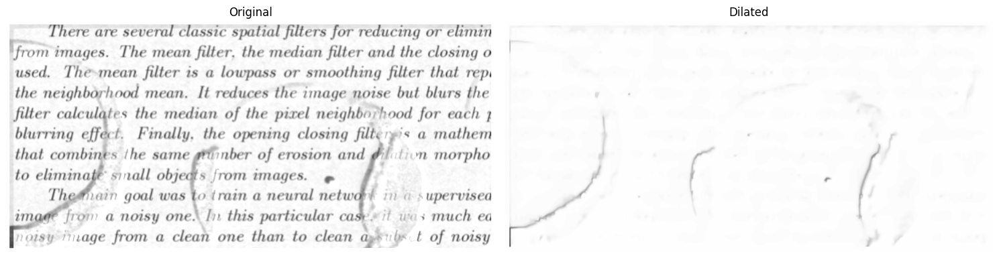

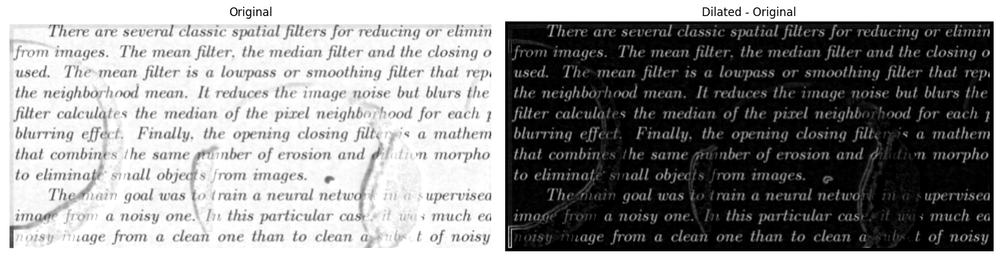

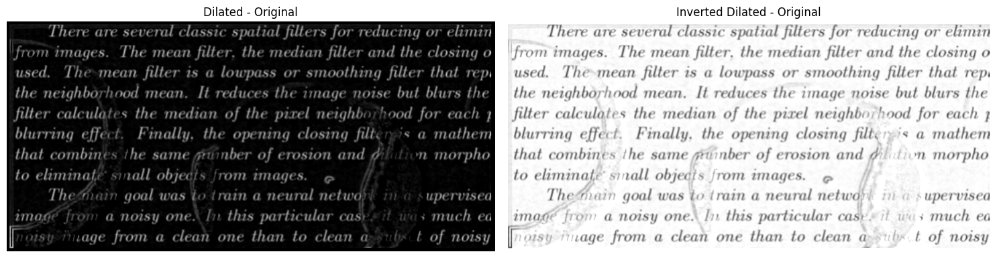

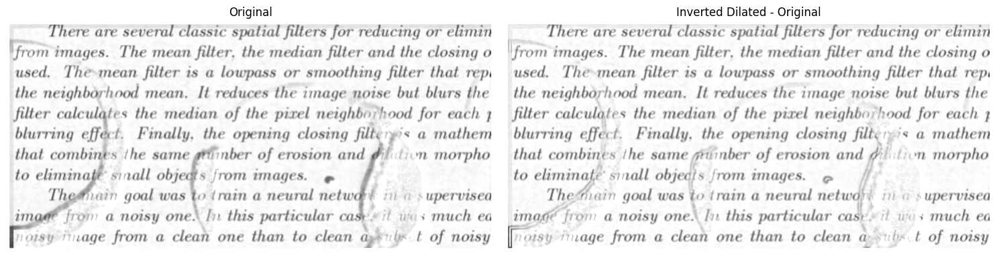

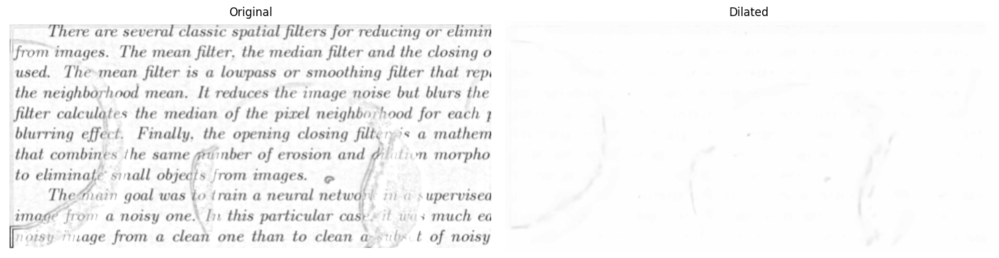

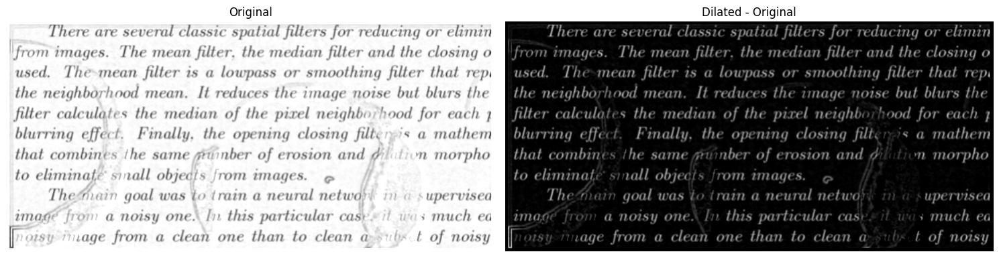

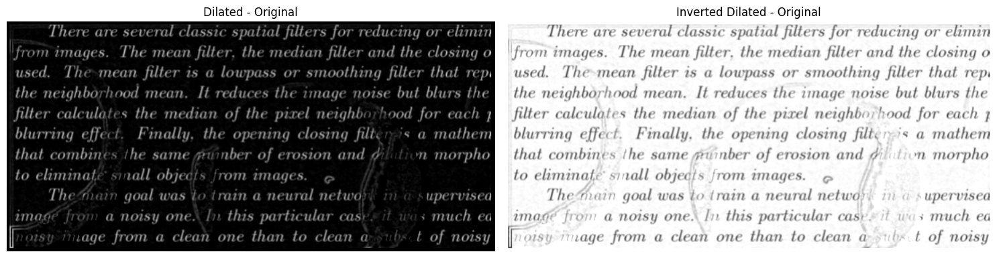

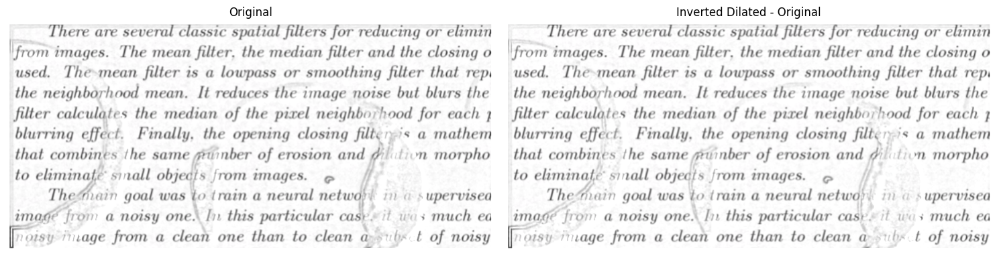

In [ ]:
# Invert the subtraction result
inverted_subtract_eroded_dilated = cv2.bitwise_not(subtract_eroded_dilated)

# Remove spots from the inverted image
spots_removed_once = remove_spots(inverted_subtract_eroded_dilated, kernel_size=5)
spots_removed_twice = remove_spots(spots_removed_once, kernel_size=5)

#### Third try

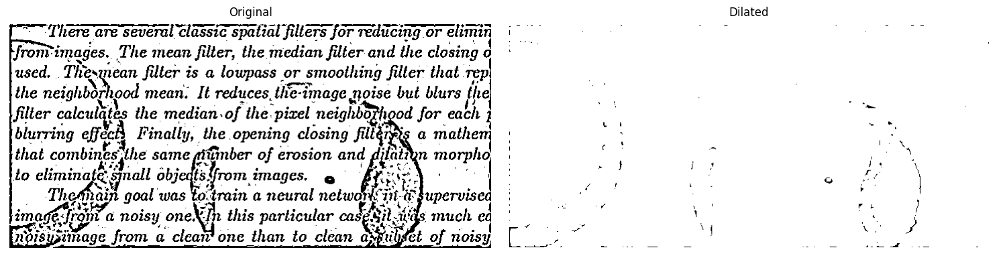

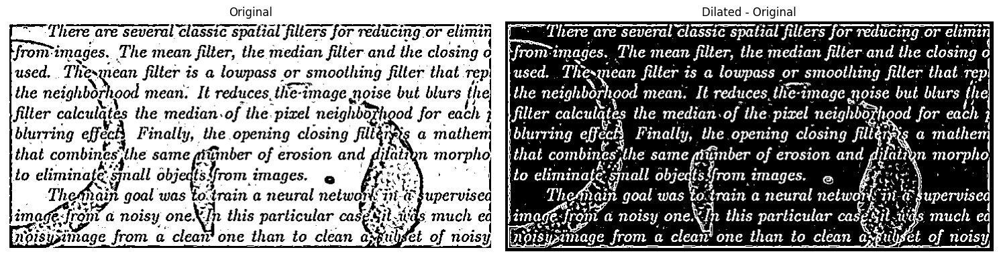

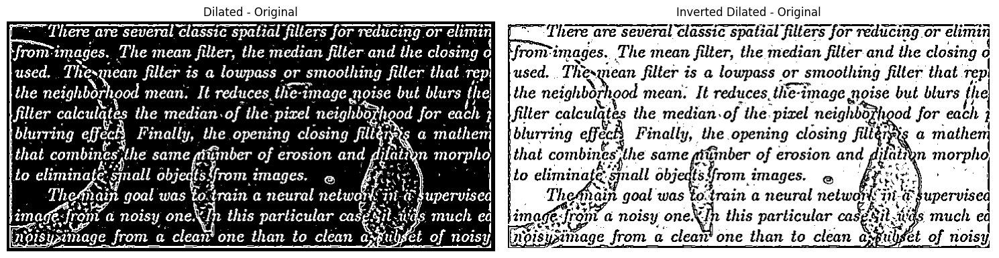

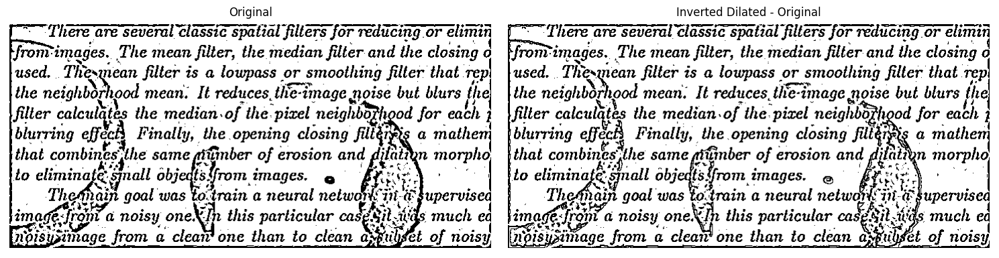

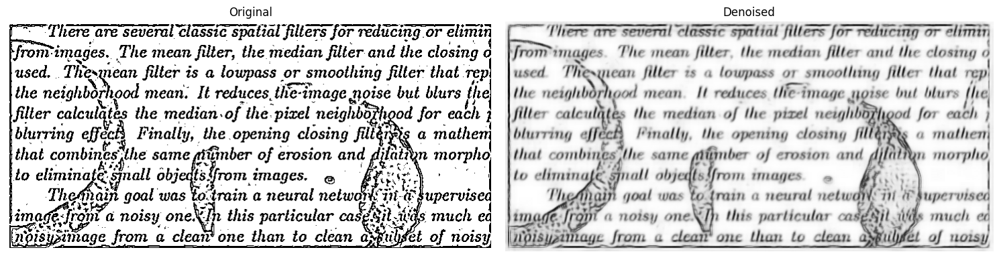

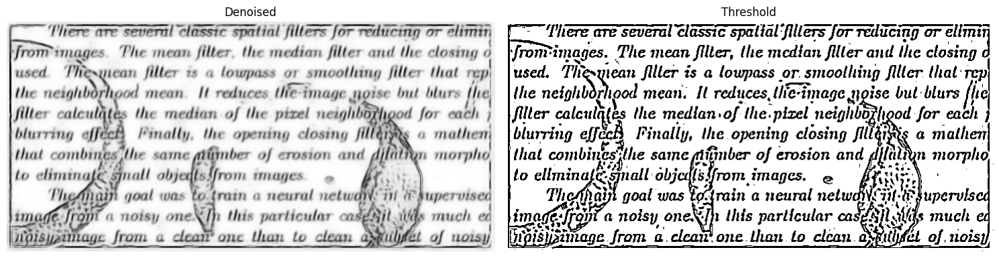

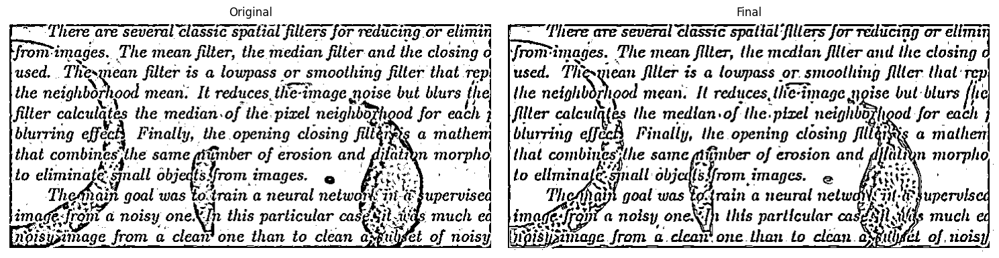

In [ ]:
# Apply adaptive thresholding to the denoised image
denoised_threshold_adaptive = apply_threshold(denoise_image(img_rgb), method="adaptive")

# Remove spots from the thresholded image
first = remove_spots(denoised_threshold_adaptive, kernel_size=4)

# Denoise the image after removing spots
second = denoise_image(first, h=100)
display_images([first, second], ["Original", "Denoised"])

# Apply adaptive thresholding to the denoised image
third = apply_threshold(second, method="adaptive")
display_images([second, third], ["Denoised", "Threshold"])

# Display the original thresholded image and the final processed image
display_images([denoised_threshold_adaptive, third], ["Original", "Final"])

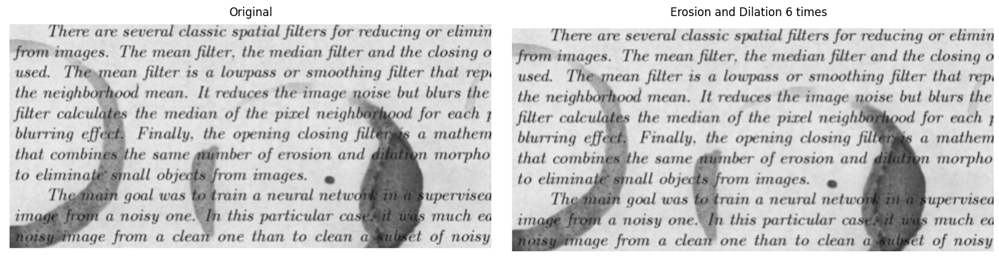

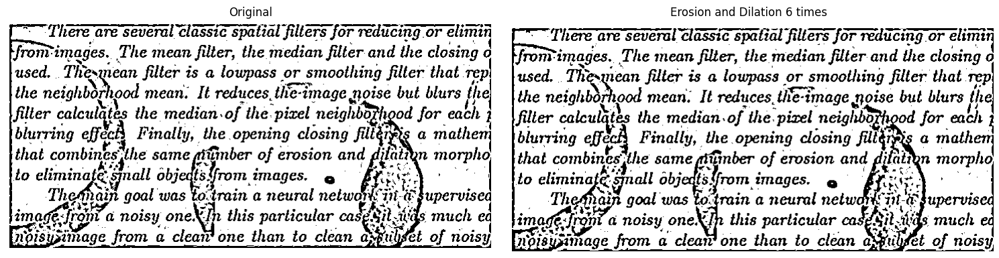

In [ ]:
def repeat_erosion_dilation(image, times=3, kernel_size=2):
    for i in range(times):
        image = apply_morphology(image, "erosion", kernel_size)
        image = apply_morphology(image, "dilation", kernel_size)
    return image


# trying = repeat_erosion_dilation(img, times=6, kernel_size=2)
# display_images([img, trying], ['Original', 'Erosion and Dilation 6 times'])
# try2 = repeat_erosion_dilation(denoised_threshold_adaptive, times=6, kernel_size=2)
# display_images([denoised_threshold_adaptive, try2], ['Original', 'Erosion and Dilation 6 times'])

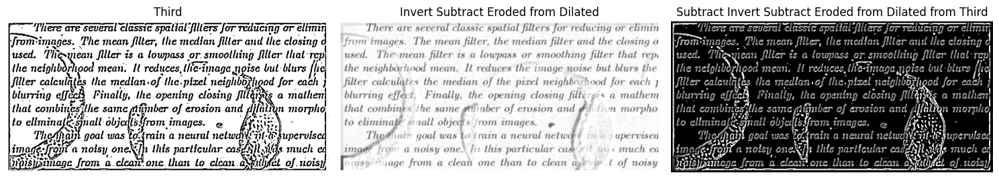

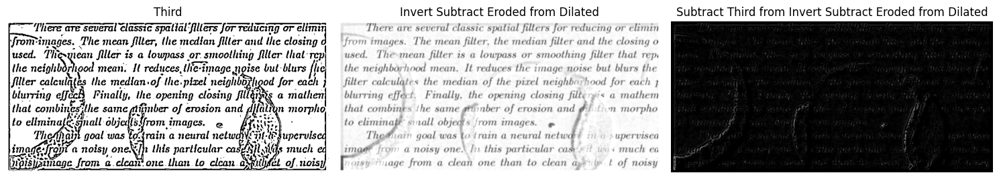

In [10]:
substract_inv_third = cv2.subtract(
    invert_subtract_eroded_dilated, cv2.cvtColor(third, cv2.COLOR_RGB2BGR)
)
display_images(
    [third, invert_subtract_eroded_dilated, substract_inv_third],
    [
        "Third",
        "Invert Subtract Eroded from Dilated",
        "Subtract Invert Subtract Eroded from Dilated from Third",
    ],
)
substract_third_inv = cv2.subtract(
    cv2.cvtColor(third, cv2.COLOR_RGB2BGR), invert_subtract_eroded_dilated
)
display_images(
    [third, invert_subtract_eroded_dilated, substract_third_inv],
    [
        "Third",
        "Invert Subtract Eroded from Dilated",
        "Subtract Third from Invert Subtract Eroded from Dilated",
    ],
)
# inv_substract_third_inv = cv2.bitwise_not(substract_third_inv)
# display_images([substract_third_inv, inv_substract_third_inv], ['Subtract Third from Invert Subtract Eroded from Dilated', 'Invert Subtract Third from Invert Subtract Eroded from Dilated'])

### Second img

In [15]:
# Example usage:
image_path2 = "low quality documents/2.png"
img2 = cv2.imread(image_path2)
if img2 is None:
    raise ValueError(f"Could not read image at {image_path2}")

# Convert BGR to RGB for display
img_rgb2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

# Apply different techniques
denoised = cv2.cvtColor(denoise_image(img2), cv2.COLOR_BGR2RGB)
eroded = cv2.cvtColor(apply_morphology(img2, "erosion"), cv2.COLOR_BGR2RGB)
dilated = cv2.cvtColor(apply_morphology(img2, "dilation"), cv2.COLOR_BGR2RGB)
threshold = apply_threshold(img2, "otsu")
edges = detect_edges(img2)
equalized = cv2.cvtColor(equalize_histogram(img2), cv2.COLOR_BGR2RGB)

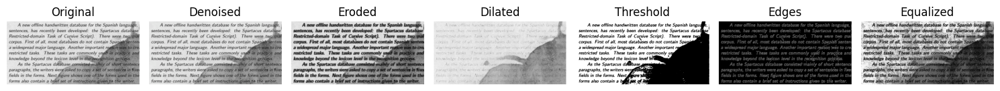

In [16]:
techniques = [img_rgb2, denoised, eroded, dilated, threshold, edges, equalized]
titles = [
    "Original",
    "Denoised",
    "Eroded",
    "Dilated",
    "Threshold",
    "Edges",
    "Equalized",
]
display_images(techniques, titles)

#### First try:

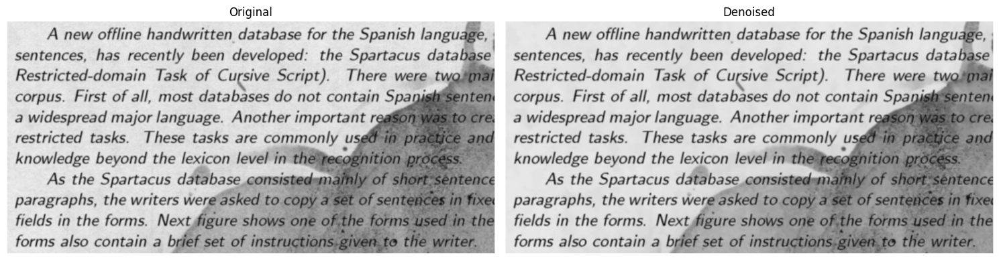

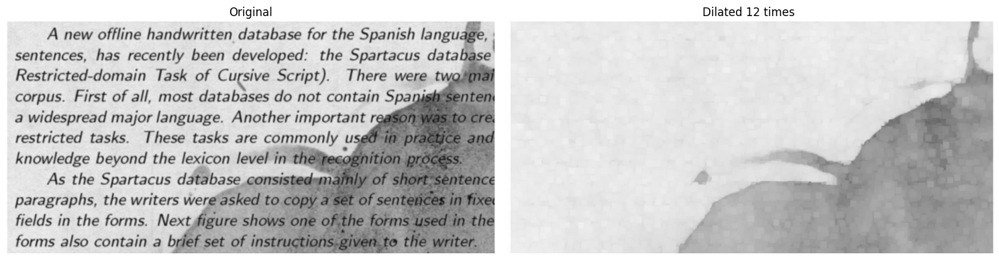

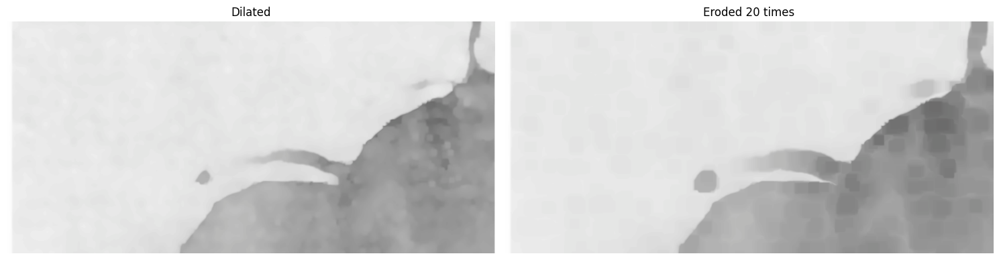

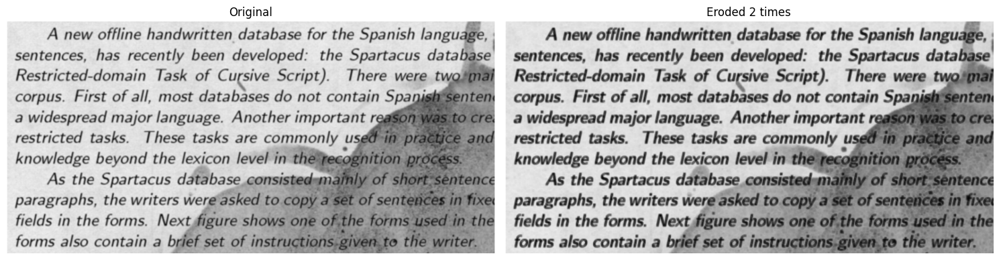

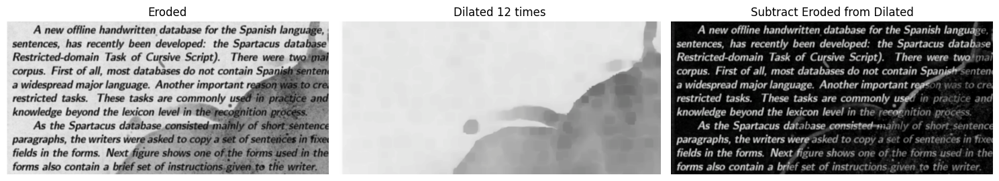

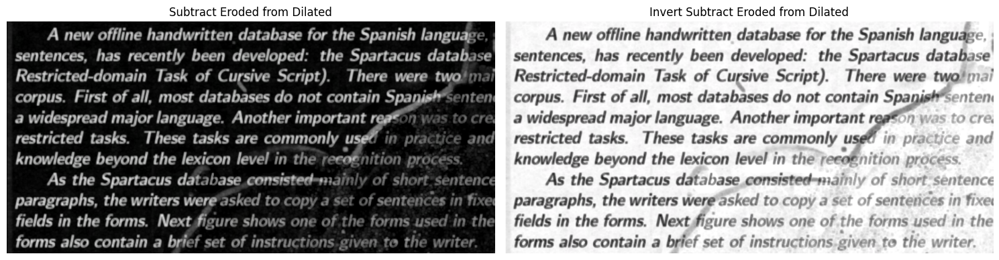

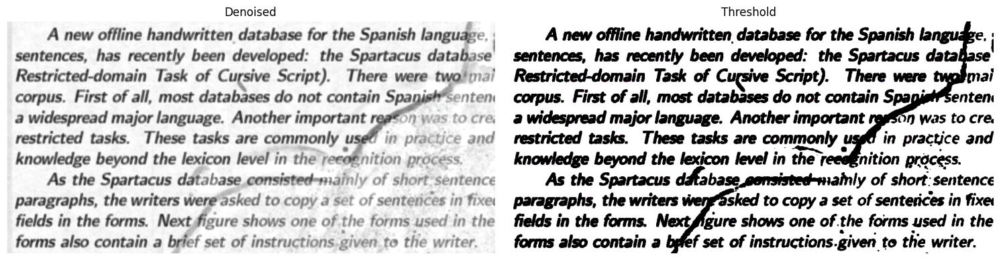

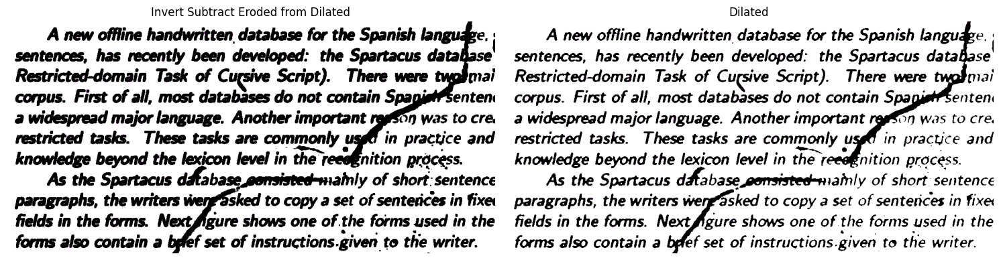

In [123]:
# original image denoise
denoised2 = cv2.cvtColor(denoise_image(img2, h=2), cv2.COLOR_BGR2RGB)
display_images([img_rgb2, denoised2], ["Original", "Denoised"])

# dilate the image 3 times
dilate_nr2 = 12
dilated_times2 = repeat_action(img2, "dilation", times=dilate_nr2, kernel_size=2)
display_images([img_rgb2, dilated_times2], ["Original", f"Dilated {dilate_nr2} times"])
# denoise the dilated image
dilated_times2 = cv2.cvtColor(denoise_image(dilated_times2, h=5), cv2.COLOR_BGR2RGB)
# erode the dilated 3 times
erode_nr2 = 20
eroded_t2 = repeat_action(dilated_times2, "erosion", times=erode_nr2, kernel_size=2)
display_images([dilated_times2, eroded_t2], ["Dilated", f"Eroded {erode_nr2} times"])
dilated_times2 = eroded_t2


# erode the image 3 times
erode_nr2 = 2
eroded_times2 = repeat_action(img2, "erosion", times=erode_nr2, kernel_size=2)
display_images([img_rgb2, eroded_times2], ["Original", f"Eroded {erode_nr2} times"])

# # substraction
substract_eroded_dilated2 = cv2.subtract(dilated_times2, eroded_times2)
display_images(
    [eroded_times2, dilated_times2, substract_eroded_dilated2],
    ["Eroded", f"Dilated {dilate_nr2} times", "Subtract Eroded from Dilated"],
)
# invert the substraction
invert_substract_eroded_dilated2 = cv2.bitwise_not(substract_eroded_dilated2)
display_images(
    [substract_eroded_dilated2, invert_substract_eroded_dilated2],
    ["Subtract Eroded from Dilated", "Invert Subtract Eroded from Dilated"],
)


# binary the denoised inverted substraction
_, threshold_invert_substract_eroded_dilated2 = cv2.threshold(
    invert_substract_eroded_dilated2, 200, 255, cv2.THRESH_BINARY
)
display_images(
    [invert_substract_eroded_dilated2, threshold_invert_substract_eroded_dilated2],
    ["Denoised", "Threshold"],
)

# dilate the inverted substraction
dilated_invert_substract_eroded_dilated2 = repeat_action(
    threshold_invert_substract_eroded_dilated2, "dilation", times=2, kernel_size=2
)
display_images(
    [
        threshold_invert_substract_eroded_dilated2,
        dilated_invert_substract_eroded_dilated2,
    ],
    ["Invert Subtract Eroded from Dilated", "Dilated"],
)


# # denoise the inverted substraction
# denoised_invert_substract_eroded_dilated2 = cv2.cvtColor(denoise_image(dilated_invert_substract_eroded_dilated2, h=15), cv2.COLOR_BGR2RGB)
# display_images([dilated_invert_substract_eroded_dilated2, denoised_invert_substract_eroded_dilated2],
#                 ['Invert Subtract Eroded from Dilated', 'Denoised'])

# # threshold the denoised inverted substraction
# _, threshold_invert_substract_eroded_dilated2 = cv2.threshold(denoised_invert_substract_eroded_dilated2, 250, 255, cv2.THRESH_BINARY)
# display_images([denoised_invert_substract_eroded_dilated2, threshold_invert_substract_eroded_dilated2],
#                 ['Denoised', 'Threshold'])


# # greyscale
# threshold_invert_substract_eroded_dilated2 = cv2.cvtColor(threshold_invert_substract_eroded_dilated2, cv2.COLOR_BGR2RGB)


# # dilate the equalized inverted substraction
# dilated_equalized_invert_substract_eroded_dilated2 = repeat_action(threshold_invert_substract_eroded_dilated2, 'dilation', times=8, kernel_size=2)
# display_images([threshold_invert_substract_eroded_dilated2, dilated_equalized_invert_substract_eroded_dilated2],
#                 ['Equalized', 'Dilated'])

# # substract
# substract_inv_third = cv2.subtract(cv2.cvtColor(dilated_equalized_invert_substract_eroded_dilated2, cv2.COLOR_RGB2BGR),invert_substract_eroded_dilated2 )
# display_images([dilated_equalized_invert_substract_eroded_dilated2, invert_substract_eroded_dilated2, substract_inv_third], ['Third', 'Invert Subtract Eroded from Dilated', 'Subtract Invert Subtract Eroded from Dilated from Third'])

# # erosion the denoised inverted substraction
# eroded_denoised_invert_substract_eroded_dilated2 = repeat_action(threshold_invert_substract_eroded_dilated2, 'erosion', times=30, kernel_size=2)
# display_images([threshold_invert_substract_eroded_dilated2, eroded_denoised_invert_substract_eroded_dilated2],
#                 ['Denoised', 'Eroded'])

# # equalize the substraction
# equalized_substract_eroded_dilated2 = cv2.cvtColor(equalize_histogram(denoised_invert_substract_eroded_dilated2), cv2.COLOR_BGR2RGB)
# display_images([denoised_invert_substract_eroded_dilated2, equalized_substract_eroded_dilated2],
#                 ['Subtract Eroded from Dilated', 'Equalized'])

# # edges from substraction
# edges_substract_eroded_dilated2 = cv2.cvtColor(equalize_histogram(detect_edges(substract_eroded_dilated2)), cv2.COLOR_BGR2RGB)
# display_images([substract_eroded_dilated2, edges_substract_eroded_dilated2],
#                ['Subtract Eroded from Dilated', 'Edges'])

# # edges minus inverted substraction
# substraction = cv2.subtract(invert_substract_eroded_dilated2,edges_substract_eroded_dilated2)
# display_images([edges_substract_eroded_dilated2, invert_substract_eroded_dilated2, substraction],
#                ['Edges', 'Invert Subtract Eroded from Dilated', 'Subtract Edges from Invert Subtract Eroded from Dilated'])

# # binary the denoised inverted substraction
# _, threshold_invert_substract_eroded_dilated2 = cv2.threshold(denoised_invert_substract_eroded_dilated2, 210, 255, cv2.THRESH_BINARY)
# display_images([denoised_invert_substract_eroded_dilated2, threshold_invert_substract_eroded_dilated2],
#                 ['Denoised', 'Threshold'])

# # dilate the binary
# dilated_binary = apply_morphology(threshold_invert_substract_eroded_dilated2, 'dilation', kernel_size=2)
# display_images([threshold_invert_substract_eroded_dilated2, dilated_binary],
#                 ['Threshold', 'Dilated'])


# # substraction dilated from orig
# substract_dilated_orig = cv2.subtract(dilated_times2,img_rgb2)
# display_images([img_rgb2, dilated_times2, substract_dilated_orig],
#                ['Original', f'Dilated {dilate_nr2} times', 'Subtract Dilated from Original'])

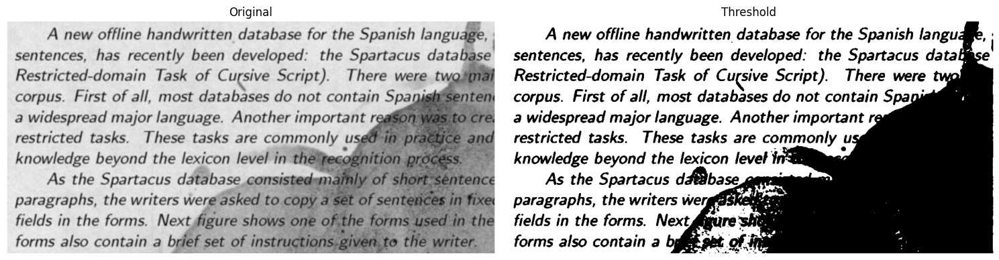

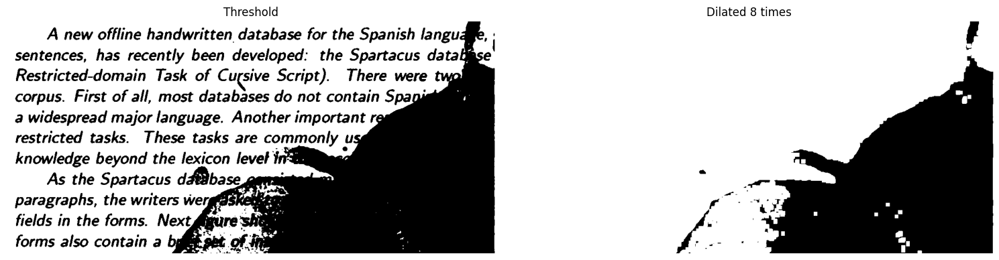

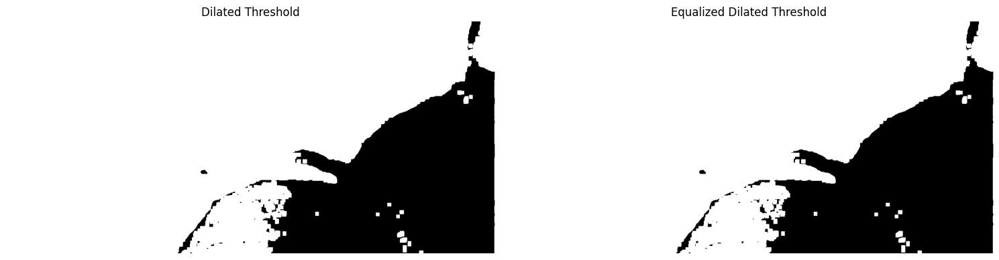

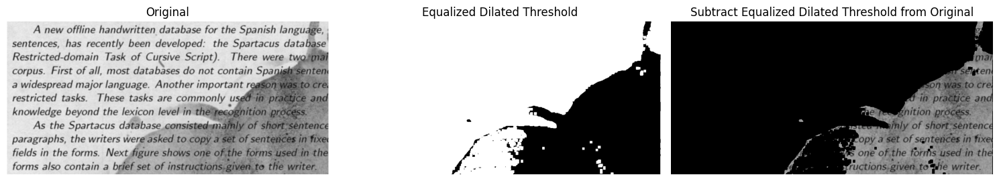

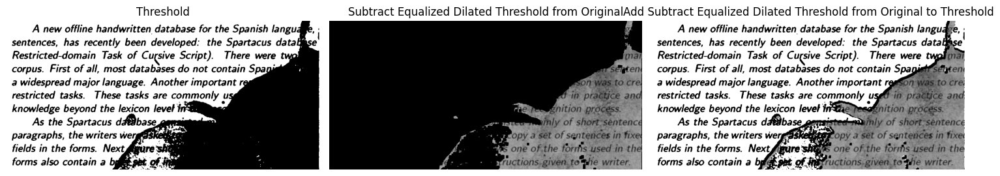

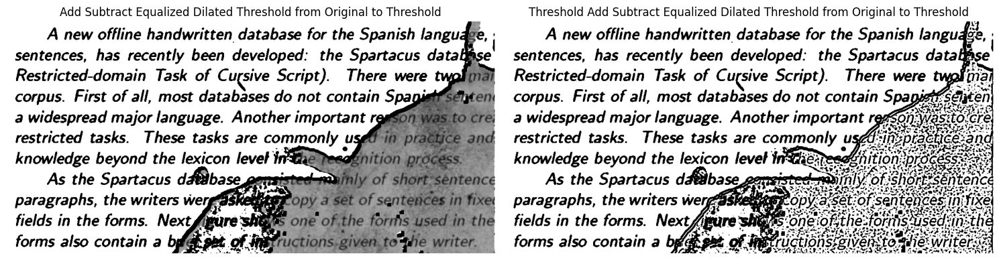

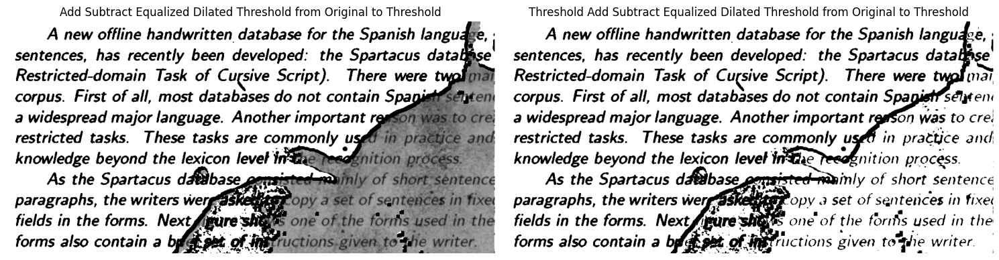

In [125]:
# treashold the original
threshold_orig = apply_threshold(img2, "otsu")
display_images([img_rgb2, threshold_orig], ["Original", "Threshold"])
# dilate the thresholded image
dilated_nr_2 = 8
dilated_threshold = repeat_action(
    threshold_orig, "dilation", times=dilated_nr_2, kernel_size=2
)
display_images(
    [threshold_orig, dilated_threshold], ["Threshold", f"Dilated {dilated_nr_2} times"]
)

# equalize the dilated thresholded image
equalized_dilated_threshold = cv2.cvtColor(
    equalize_histogram(dilated_threshold), cv2.COLOR_BGR2RGB
)
display_images(
    [dilated_threshold, equalized_dilated_threshold],
    ["Dilated Threshold", "Equalized Dilated Threshold"],
)
#  substraction orig from eq dilated threshold
substract_eq_dilated_orig = cv2.subtract(img_rgb2, equalized_dilated_threshold)
display_images(
    [img_rgb2, equalized_dilated_threshold, substract_eq_dilated_orig],
    [
        "Original",
        "Equalized Dilated Threshold",
        "Subtract Equalized Dilated Threshold from Original",
    ],
)

# add the substraction_eq_dilated_orig to the threshold_orig
add_substract_eq_dilated_orig = cv2.add(
    cv2.cvtColor(equalize_histogram(threshold_orig), cv2.COLOR_BGR2RGB),
    substract_eq_dilated_orig,
)
display_images(
    [threshold_orig, substract_eq_dilated_orig, add_substract_eq_dilated_orig],
    [
        "Threshold",
        "Subtract Equalized Dilated Threshold from Original",
        "Add Subtract Equalized Dilated Threshold from Original to Threshold",
    ],
)

# apply threshold to the add_substract_eq_dilated_orig
threshold_add_substract_eq_dilated_orig = apply_threshold(
    add_substract_eq_dilated_orig, "adaptive"
)
display_images(
    [add_substract_eq_dilated_orig, threshold_add_substract_eq_dilated_orig],
    [
        "Add Subtract Equalized Dilated Threshold from Original to Threshold",
        "Threshold Add Subtract Equalized Dilated Threshold from Original to Threshold",
    ],
)

_, thresh = cv2.threshold(add_substract_eq_dilated_orig, 80, 255, cv2.THRESH_BINARY)
display_images(
    [add_substract_eq_dilated_orig, thresh],
    [
        "Add Subtract Equalized Dilated Threshold from Original to Threshold",
        "Threshold Add Subtract Equalized Dilated Threshold from Original to Threshold",
    ],
)

# # erosion of the substraction
# eroded_substract_dilated2 = cv2.cvtColor(apply_morphology(substract_eroded_dilated2, 'erosion', kernel_size=20), cv2.COLOR_BGR2RGB)
# display_images([substract_eroded_dilated2, eroded_substract_dilated2],
#                ['Subtract Eroded from Dilated', 'Eroded Subtract Eroded from Dilated'])

# # denoise the eroded substraction
# denoised_eroded_substract_dilated2 = cv2.cvtColor(denoise_image(eroded_substract_dilated2, h=20), cv2.COLOR_BGR2RGB)
# display_images([eroded_substract_dilated2, denoised_eroded_substract_dilated2],
#                ['Eroded Subtract Eroded from Dilated', 'Denoised Eroded Subtract Eroded from Dilated'])

### Third img

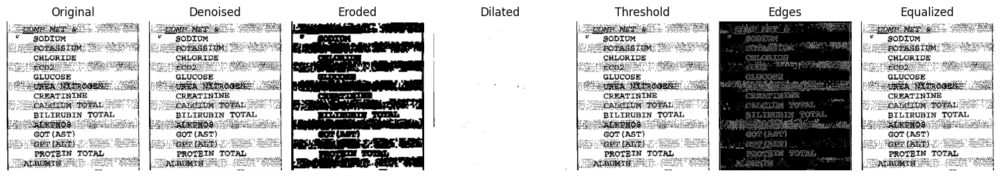

In [126]:
# Example usage:
image_path3 = "low quality documents/3.png"
img3 = cv2.imread(image_path3)
if img3 is None:
    raise ValueError(f"Could not read image at {image_path3}")

# Convert BGR to RGB for display
img_rgb3 = cv2.cvtColor(img3, cv2.COLOR_BGR2RGB)

# Apply different techniques
denoised = cv2.cvtColor(denoise_image(img3), cv2.COLOR_BGR2RGB)
eroded = cv2.cvtColor(apply_morphology(img3, "erosion"), cv2.COLOR_BGR2RGB)
dilated = cv2.cvtColor(apply_morphology(img3, "dilation"), cv2.COLOR_BGR2RGB)
threshold = apply_threshold(img3, "otsu")
edges = detect_edges(img3)
equalized = cv2.cvtColor(equalize_histogram(img3), cv2.COLOR_BGR2RGB)

techniques = [img_rgb3, denoised, eroded, dilated, threshold, edges, equalized]
titles = [
    "Original",
    "Denoised",
    "Eroded",
    "Dilated",
    "Threshold",
    "Edges",
    "Equalized",
]
display_images(techniques, titles)

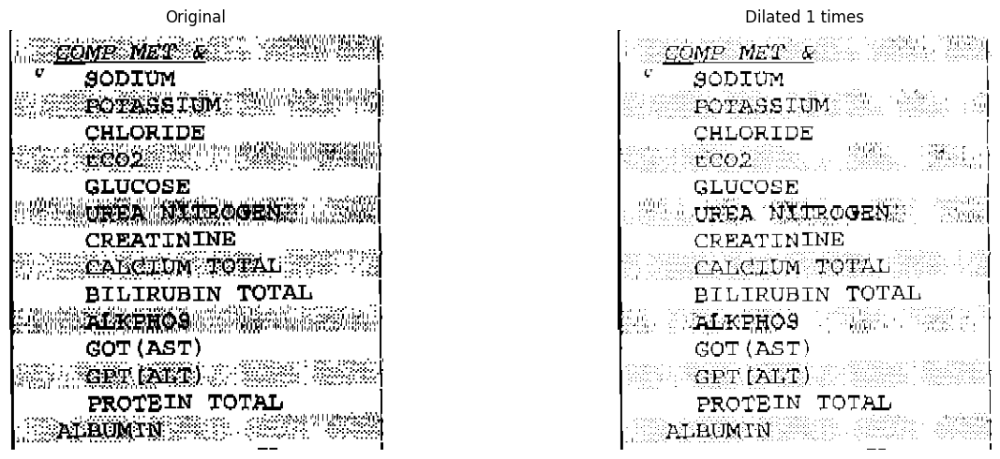

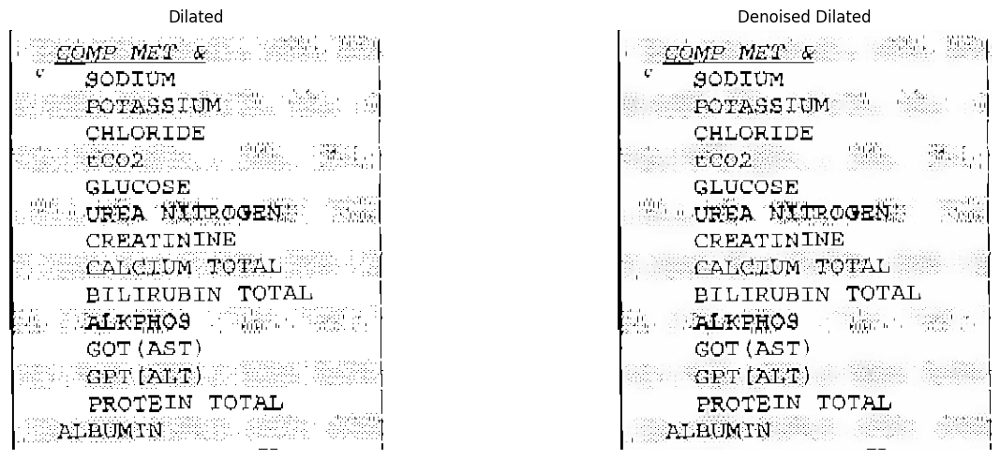

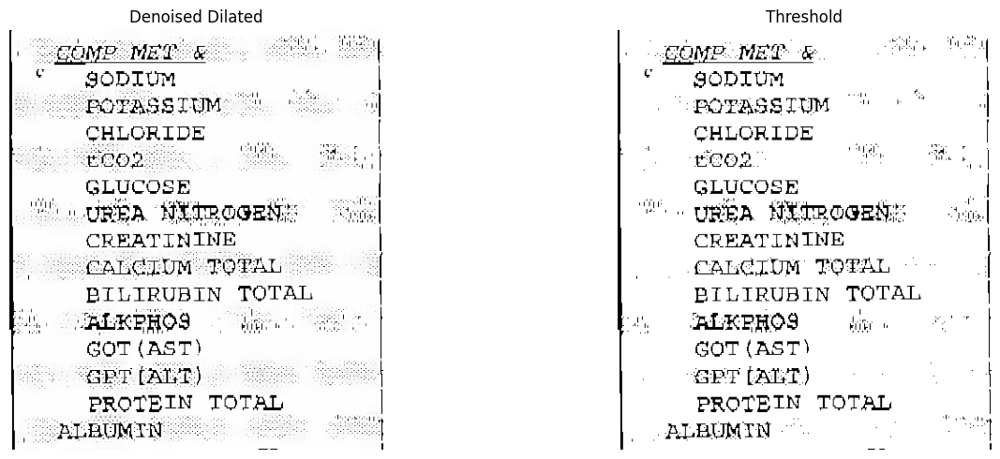

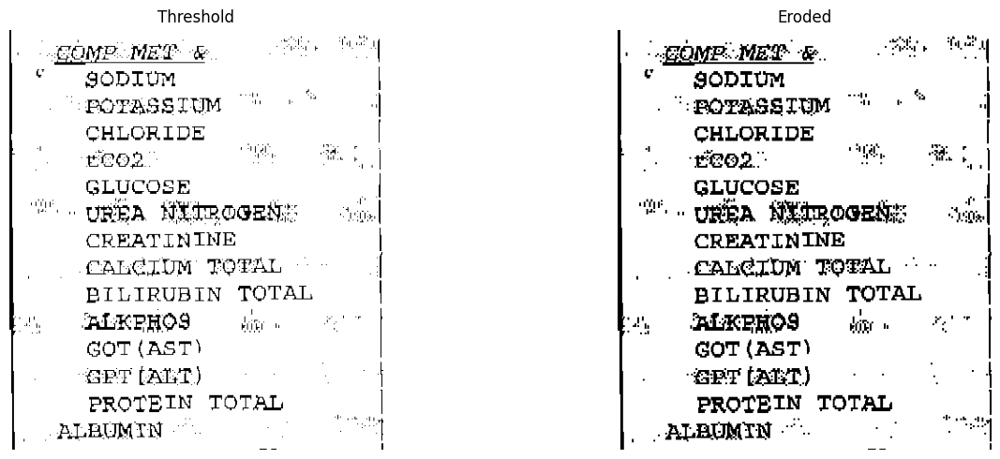

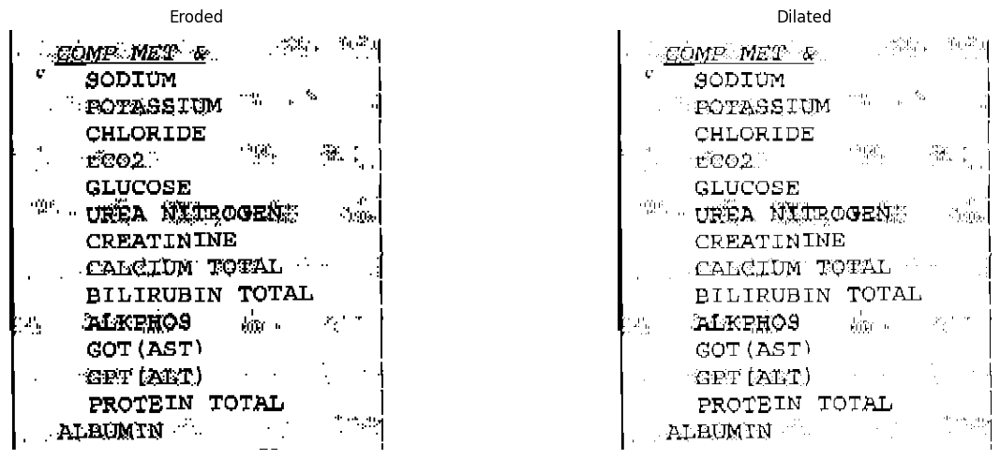

...

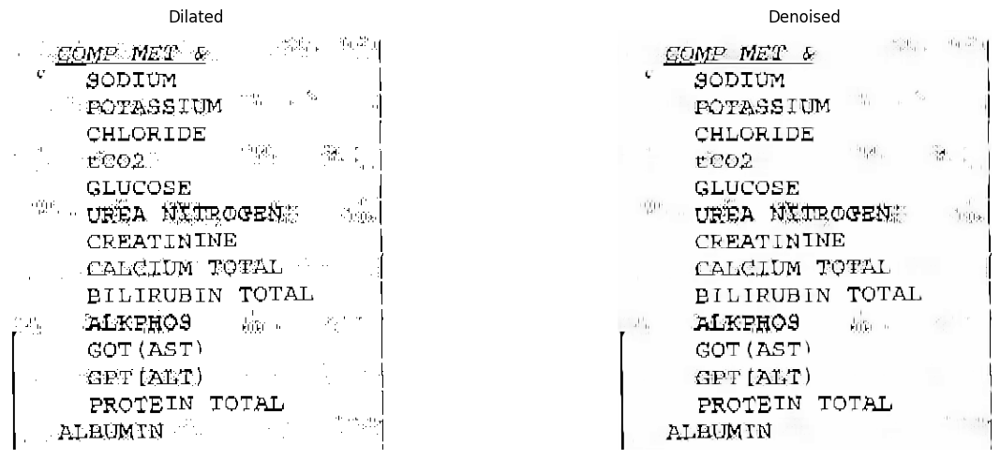

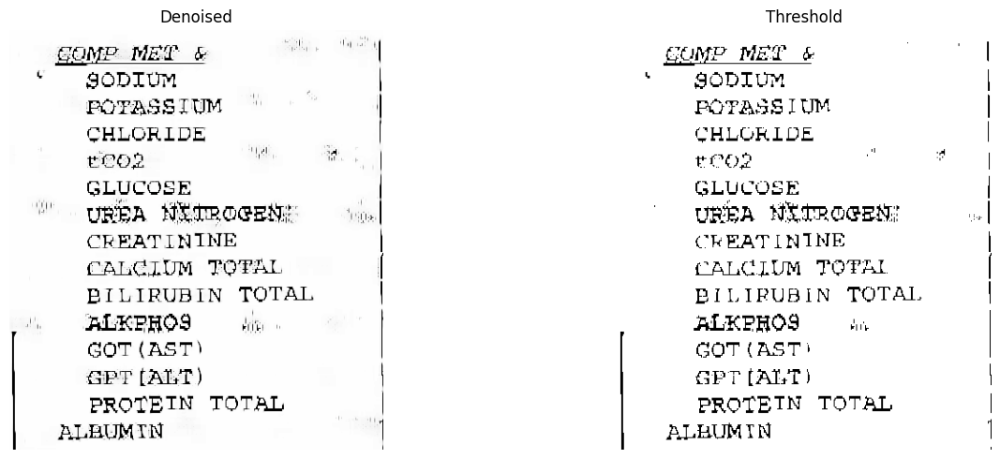

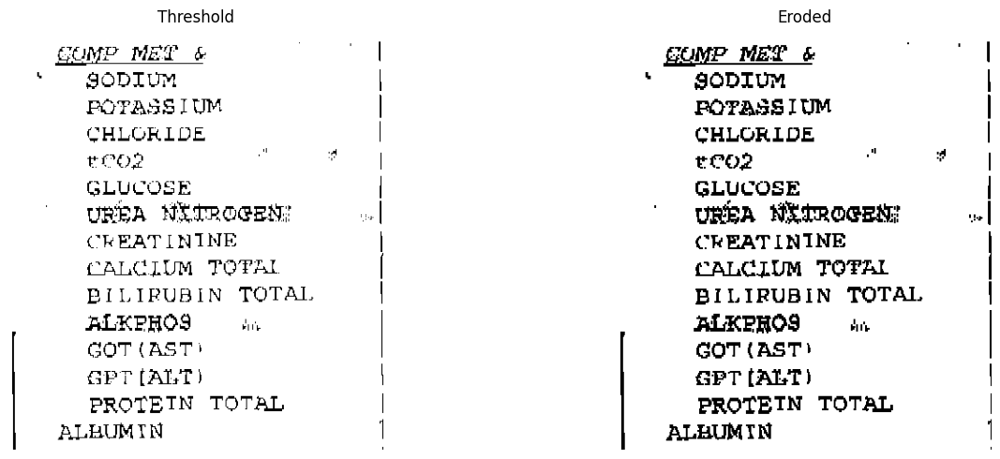

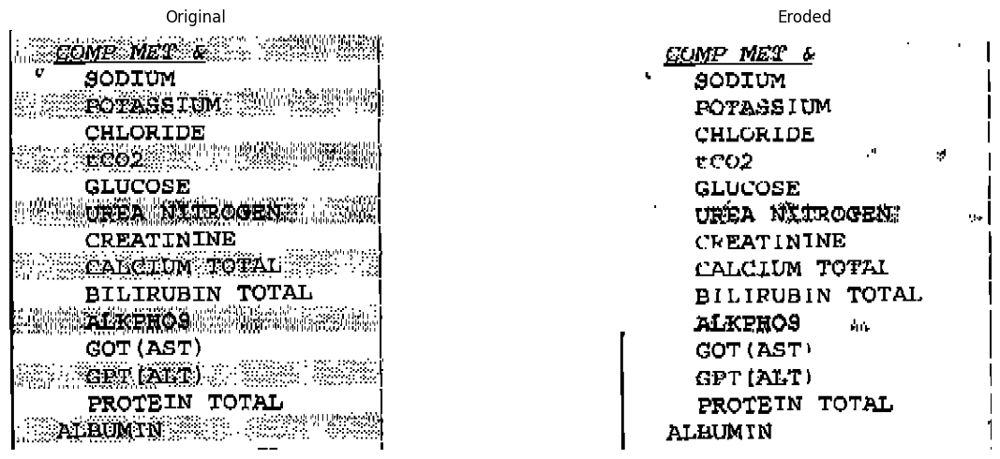

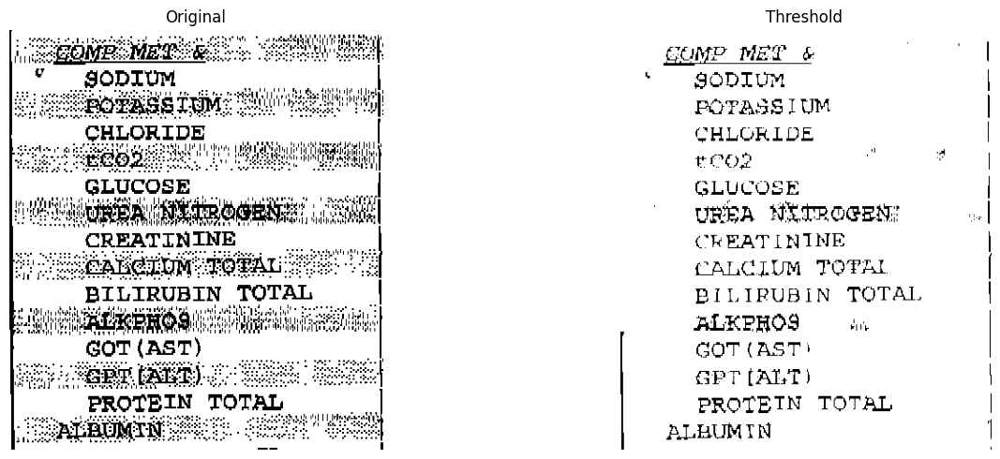

In [189]:
# dilate the image once
dilated_nr3 = 1
dilated_times3 = repeat_action(img3, "dilation", times=dilated_nr3, kernel_size=2)
display_images([img_rgb3, dilated_times3], ["Original", f"Dilated {dilated_nr3} times"])

# remove noise
denoised_dilated_times3 = cv2.cvtColor(
    denoise_image(dilated_times3, h=30), cv2.COLOR_BGR2RGB
)
display_images(
    [dilated_times3, denoised_dilated_times3], ["Dilated", "Denoised Dilated"]
)

# threshold binary
_, threshold_denoised_dilated_times3 = cv2.threshold(
    denoised_dilated_times3, 2, 255, cv2.THRESH_BINARY
)
display_images(
    [denoised_dilated_times3, threshold_denoised_dilated_times3],
    ["Denoised Dilated", "Threshold"],
)

# erosion
eroded_from_dilated3 = repeat_action(
    threshold_denoised_dilated_times3, "erosion", times=1, kernel_size=2
)
display_images(
    [threshold_denoised_dilated_times3, eroded_from_dilated3], ["Threshold", "Eroded"]
)

# dilate
dilated_from_eroded3 = repeat_action(
    eroded_from_dilated3, "dilation", times=1, kernel_size=2
)
display_images([eroded_from_dilated3, dilated_from_eroded3], ["Eroded", "Dilated"])

# dilate the image 3 times
dilated_nr3 = 3
dilated_times3 = repeat_action(
    dilated_from_eroded3, "dilation", times=dilated_nr3, kernel_size=2
)
display_images(
    [dilated_from_eroded3, dilated_times3], ["Dilated", f"Dilated {dilated_nr3} times"]
)

#  substraction
substract_eroded_dilated3 = cv2.subtract(dilated_times3, eroded_from_dilated3)
display_images(
    [eroded_from_dilated3, substract_eroded_dilated3],
    ["Eroded", "Subtract Eroded from Dilated"],
)

# invert the substraction
invert_substract_eroded_dilated3 = cv2.bitwise_not(substract_eroded_dilated3)
display_images(
    [img_rgb3, invert_substract_eroded_dilated3],
    ["Original", "Invert Subtract Eroded from Dilated"],
)

# dilate the inverted substraction
dilated_invert_substract_eroded_dilated3 = repeat_action(
    invert_substract_eroded_dilated3, "dilation", times=1, kernel_size=2
)
display_images(
    [invert_substract_eroded_dilated3, dilated_invert_substract_eroded_dilated3],
    ["Invert Subtract Eroded from Dilated", "Dilated"],
)

# denoise the dilated inverted substraction
denoised_dilated_invert_substract_eroded_dilated3 = cv2.cvtColor(
    denoise_image(dilated_invert_substract_eroded_dilated3, h=50), cv2.COLOR_BGR2RGB
)
display_images(
    [
        dilated_invert_substract_eroded_dilated3,
        denoised_dilated_invert_substract_eroded_dilated3,
    ],
    ["Dilated", "Denoised"],
)

# binary the denoised inverted substraction
_, threshold_denoised_dilated_invert_substract_eroded_dilated3 = cv2.threshold(
    denoised_dilated_invert_substract_eroded_dilated3, 50, 255, cv2.THRESH_BINARY
)
display_images(
    [
        denoised_dilated_invert_substract_eroded_dilated3,
        threshold_denoised_dilated_invert_substract_eroded_dilated3,
    ],
    ["Denoised", "Threshold"],
)

# erosion the binary
eroded_binary = apply_morphology(
    threshold_denoised_dilated_invert_substract_eroded_dilated3,
    "erosion",
    kernel_size=2,
)
display_images(
    [threshold_denoised_dilated_invert_substract_eroded_dilated3, eroded_binary],
    ["Threshold", "Eroded"],
)

display_images([img_rgb3, eroded_binary], ["Original", "Eroded"])